In [1]:
import warnings
warnings.filterwarnings('ignore')

print('complete!')

complete!


In [2]:
import tensorflow as tf
print(tf.__version__)

2.15.0


In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.9.4'

In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/git/Aiffel_Node/Data/cats_vs_dogs/',
    download=False,
    with_info=True,
    as_supervised=True,
)

In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print('Complete!')

Complete!


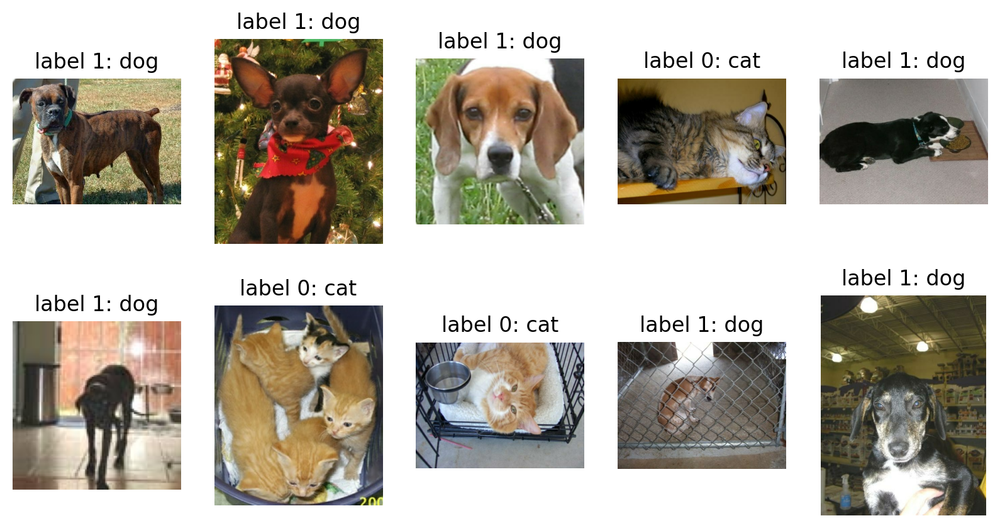

In [7]:
plt.figure(figsize=(10,5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
IMG_SIZE = 160

def format_example(image, label):
    image = tf.cast(image, tf.float32)
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    return image, label

print('Complete!')

Complete!


In [9]:
a = [1.2, 2.5, 3.7, 4.6]
a = list(map(int, a))
a

[1, 2, 3, 4]

In [10]:
b = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
b = list(map(str, b))
b

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

In [11]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


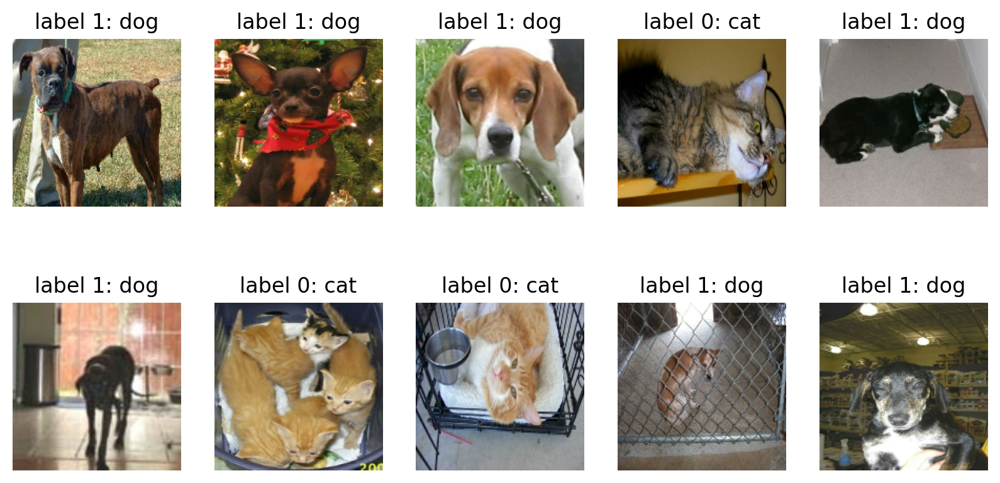

In [13]:
plt.figure(figsize=(10,5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print('complete!')

complete!


In [19]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160,160,3)), #(160, 160, 16)
    MaxPooling2D(), #(80, 80, 16)
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'), #(80, 80, 32)
    MaxPooling2D(), #(40, 40, 32)
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'), #(40, 40, 64)
    MaxPooling2D(), #(20, 20, 64)
    Flatten(), #(25600,)
    Dense(units=512, activation='relu'), #(512,)
    Dense(units=2, activation='softmax') #(2,)
])

print('Complete!')

Complete!


In [18]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 80, 80, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 40, 40, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 20, 20, 64)       

In [20]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [21]:
image.flatten()

array([1, 2, 3, 4])

In [23]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.legacy.RMSprop(learning_rate = learning_rate),
             loss = tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

print('Complete!')

Complete!


In [24]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print('complete!')

complete!


In [25]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

print('Complete!')

Complete!


In [26]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [27]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print('initial loss: {:.2f}'.format(loss0))
print('initial accuracy: {:.2f}'.format(accuracy0))

20/20 [==============================] - 1s 58ms/step - loss: 0.6875 - accuracy: 0.5453
initial loss: 0.69
initial accuracy: 0.55


In [28]:
EPOCHS = 10
history = model.fit(train_batches,
                   epochs = EPOCHS,
                   validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 119s 203ms/step - loss: 0.5873 - accuracy: 0.6823 - val_loss: 0.5295 - val_accuracy: 0.7386
Epoch 2/10
582/582 [==============================] - 115s 196ms/step - loss: 0.4749 - accuracy: 0.7733 - val_loss: 0.4853 - val_accuracy: 0.7760
Epoch 3/10
582/582 [==============================] - 112s 192ms/step - loss: 0.4122 - accuracy: 0.8131 - val_loss: 0.5260 - val_accuracy: 0.7442
Epoch 4/10
582/582 [==============================] - 102s 174ms/step - loss: 0.3548 - accuracy: 0.8447 - val_loss: 0.5011 - val_accuracy: 0.7756
Epoch 5/10
582/582 [==============================] - 100s 171ms/step - loss: 0.3040 - accuracy: 0.8707 - val_loss: 0.4485 - val_accuracy: 0.7949
Epoch 6/10
582/582 [==============================] - 99s 169ms/step - loss: 0.2535 - accuracy: 0.8965 - val_loss: 0.6352 - val_accuracy: 0.7498
Epoch 7/10
582/582 [==============================] - 99s 170ms/step - loss: 0.2063 - accuracy: 0.9190 - val_loss: 0.5173 - v

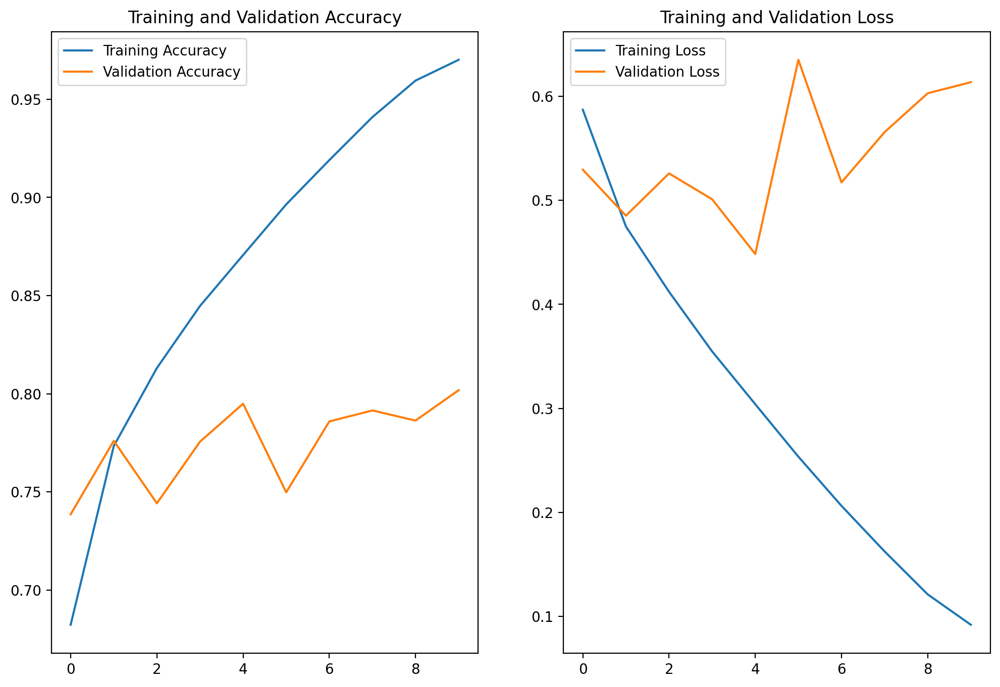

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12,8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [30]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)

    break

predictions

1/1 [==============================] - 0s 114ms/step


array([[9.99707043e-01, 2.92924844e-04],
       [9.59157467e-01, 4.08425219e-02],
       [3.75829905e-01, 6.24170005e-01],
       [9.99992013e-01, 8.02509476e-06],
       [7.53955603e-01, 2.46044382e-01],
       [5.19199789e-01, 4.80800241e-01],
       [5.26953780e-04, 9.99473035e-01],
       [9.84035909e-01, 1.59640815e-02],
       [1.13413639e-01, 8.86586368e-01],
       [7.65953287e-02, 9.23404694e-01],
       [4.21669036e-01, 5.78330934e-01],
       [9.92281616e-01, 7.71840615e-03],
       [9.95234430e-01, 4.76558972e-03],
       [4.82067026e-06, 9.99995232e-01],
       [8.86889517e-01, 1.13110475e-01],
       [9.93261516e-01, 6.73852395e-03],
       [8.10269296e-01, 1.89730689e-01],
       [4.37810153e-01, 5.62189758e-01],
       [1.58843294e-01, 8.41156721e-01],
       [2.99268402e-02, 9.70073164e-01],
       [9.99127686e-01, 8.72377190e-04],
       [9.85746861e-01, 1.42531851e-02],
       [9.33396280e-01, 6.66036531e-02],
       [1.48096189e-01, 8.51903796e-01],
       [8.344219

In [31]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 0, 0, 0])

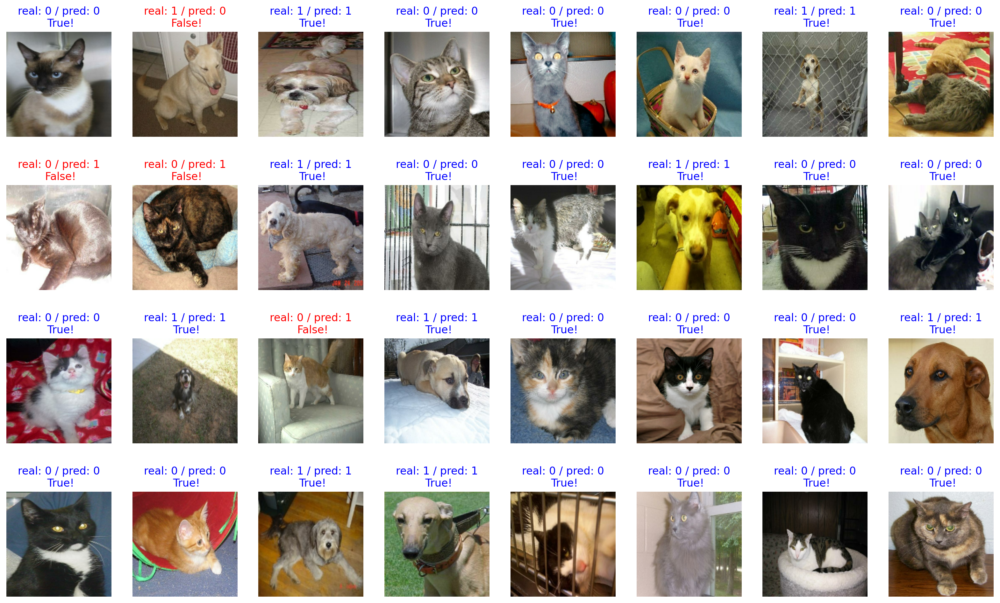

In [32]:
plt.figure(figsize=(20,12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred: {prediction}\n {correct}!'

    if not correct:
        plt.title(title, fontdict={'color':'red'})
    else:
        plt.title(title, fontdict={'color':'blue'})

    plt.axis('off')

In [35]:
count = 0

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    correct = label == prediction

    if correct:
        count += 1

print(f'{count / 32 * 100}%')

87.5%


In [36]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                        include_top=False,
                                        weights='imagenet')

In [37]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [38]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [39]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [40]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print('complete!')

complete!


In [41]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [43]:
dense_layer = tf.keras.layers.Dense(units=258,activation='relu')
prediction_layer = tf.keras.layers.Dense(units=2, activation='softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 2)


In [44]:
base_model.trainable = False
print('Complete!')

Complete!


In [45]:
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])
print('Complete!')

Complete!


In [46]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_8 (Dense)             (None, 258)               132354    
                                                                 
 dense_9 (Dense)             (None, 2)                 518       
                                                                 
Total params: 14847560 (56.64 MB)
Trainable params: 132872 (519.03 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [47]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.legacy.RMSprop(learning_rate = base_learning_rate),
             loss = tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

In [50]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps= validation_steps)

print('initial loss: {:.2f}'.format(loss0))
print('initial accuracy: {:.2f}'.format(accuracy0))

20/20 [==============================] - 36s 2s/step - loss: 0.7682 - accuracy: 0.4453
initial loss: 0.77
initial accuracy: 0.45


In [51]:
EPOCHS = 5
history = model.fit(train_batches,
                   epochs = EPOCHS,
                   validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 1210s 2s/step - loss: 0.2851 - accuracy: 0.8933 - val_loss: 0.1851 - val_accuracy: 0.9273
Epoch 2/5
582/582 [==============================] - 1144s 2s/step - loss: 0.1671 - accuracy: 0.9342 - val_loss: 0.1895 - val_accuracy: 0.9230
Epoch 3/5
582/582 [==============================] - 1193s 2s/step - loss: 0.1511 - accuracy: 0.9385 - val_loss: 0.1505 - val_accuracy: 0.9359
Epoch 4/5
582/582 [==============================] - 1220s 2s/step - loss: 0.1424 - accuracy: 0.9423 - val_loss: 0.1558 - val_accuracy: 0.9355
Epoch 5/5
582/582 [==============================] - 1159s 2s/step - loss: 0.1374 - accuracy: 0.9448 - val_loss: 0.1433 - val_accuracy: 0.9398


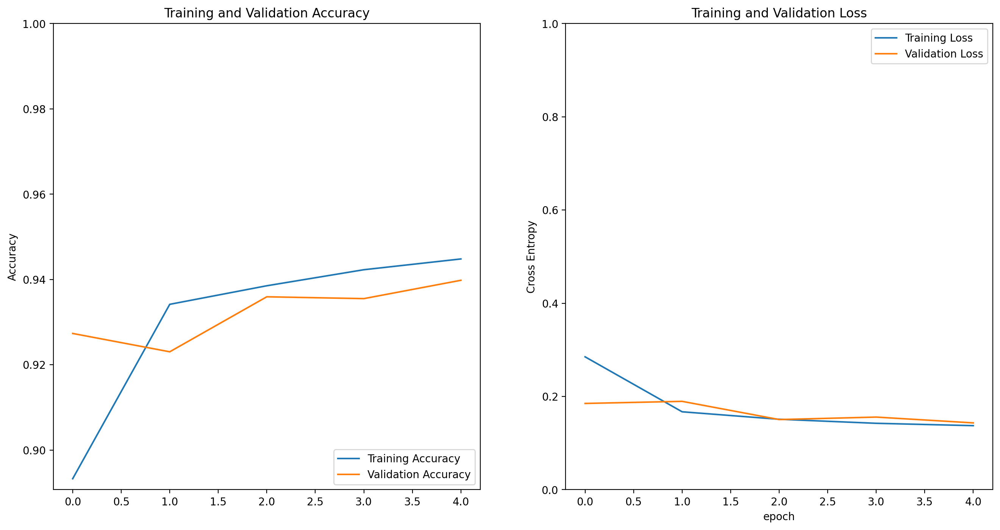

In [52]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [53]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 2s 2s/step


array([[9.99986172e-01, 1.37811248e-05],
       [2.38880813e-01, 7.61119187e-01],
       [3.40396315e-01, 6.59603596e-01],
       [9.99992967e-01, 6.97902169e-06],
       [9.98056412e-01, 1.94359396e-03],
       [9.92957354e-01, 7.04258587e-03],
       [2.04287673e-04, 9.99795735e-01],
       [6.92100942e-01, 3.07899058e-01],
       [9.62416053e-01, 3.75839844e-02],
       [9.65209842e-01, 3.47901955e-02],
       [8.42636728e-05, 9.99915719e-01],
       [9.99936700e-01, 6.32556767e-05],
       [9.91294086e-01, 8.70587304e-03],
       [8.09579069e-06, 9.99991894e-01],
       [9.98870909e-01, 1.12901046e-03],
       [9.84253645e-01, 1.57463737e-02],
       [9.65213060e-01, 3.47869396e-02],
       [1.65122703e-01, 8.34877253e-01],
       [9.63593304e-01, 3.64066102e-02],
       [7.67378960e-09, 1.00000000e+00],
       [9.99477923e-01, 5.22053859e-04],
       [9.99870896e-01, 1.29064210e-04],
       [9.75519478e-01, 2.44804975e-02],
       [3.86852264e-07, 9.99999642e-01],
       [9.996272

In [54]:
import numpy as np

predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 0, 0, 0])

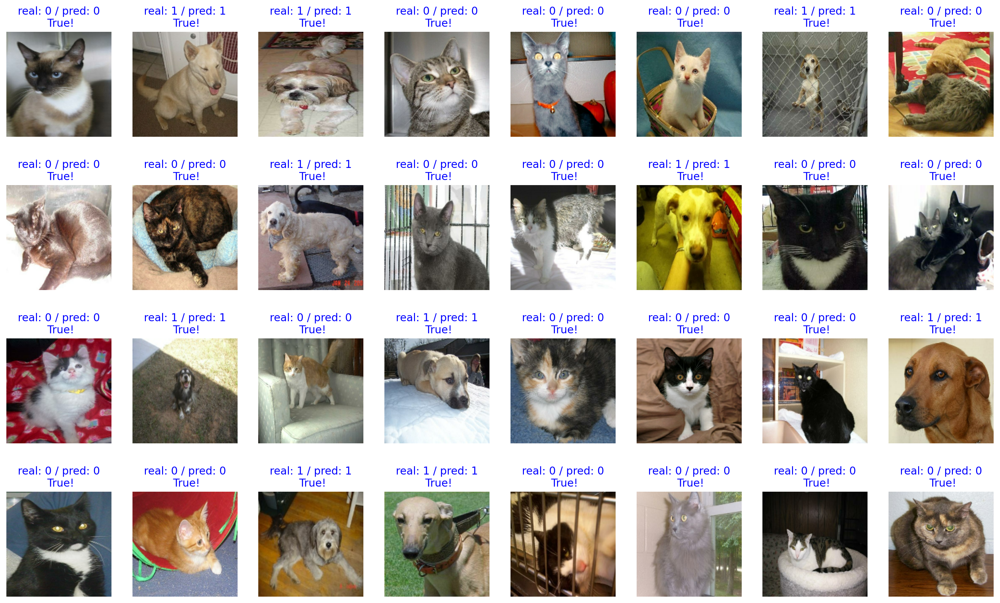

In [55]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)

    correct = label == prediction
    title = f'real: {label} / pred: {prediction}\n {correct}!'

    if not correct:
        plt.title(title, fontdict={'color':'red'})
    else:
        plt.title(title, fontdict={'color':'blue'})

    plt.axis('off')

In [56]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

100.0


In [58]:
import os

checkpoint_dir = os.getenv('HOME') + '/git/Aiffel_Node/Data/cats_vs_dogs/checkpoint'
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')

model.save_weights(checkpoint_file_path)

if os.path.exists(checkpoint_file_path):
    print('Complete to make checkpoint file!')

Complete to make checkpoint file!


In [59]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

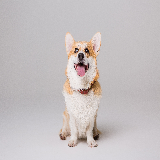

In [60]:
IMG_SIZE = 160
img_dir_path = os.getenv('HOME') + '/git/Aiffel_Node/Data/cats_vs_dogs/images'
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size = (IMG_SIZE, IMG_SIZE))
dog_image

In [61]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [62]:
prediction = model.predict(dog_image)
prediction

1/1 [==============================] - 0s 150ms/step


array([[1.7371134e-12, 1.0000000e+00]], dtype=float32)

In [67]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

1/1 [==============================] - 0s 76ms/step
This image seems 100% dog, and 0% cat.


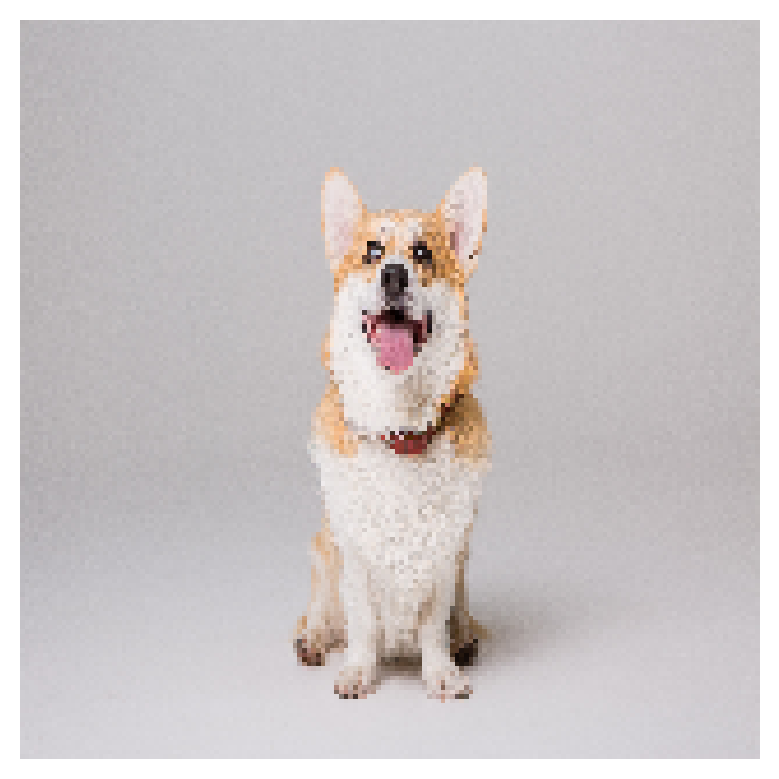

In [68]:
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

1/1 [==============================] - 0s 87ms/step
This image seems 0% dog, and 100% cat.


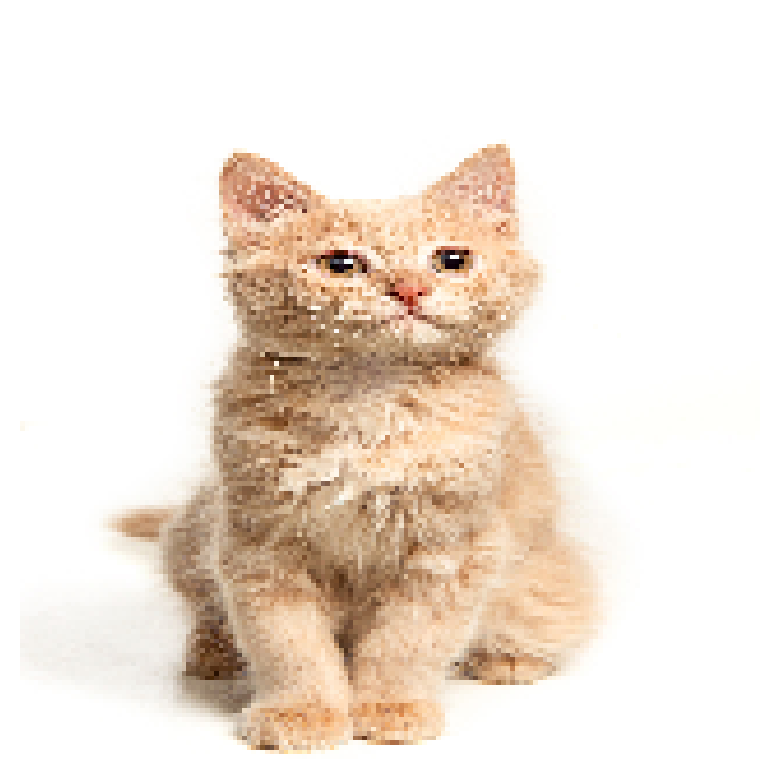

In [69]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

1/1 [==============================] - 0s 82ms/step
This image seems 100% dog, and 0% cat.


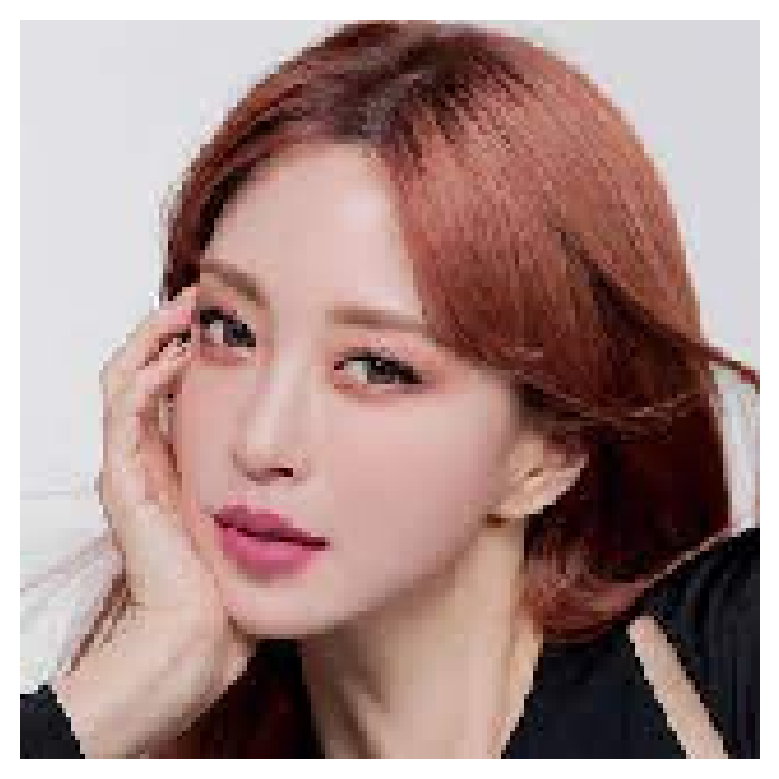

In [70]:
filename = "cat_face.jpeg"
show_and_predict_image(img_dir_path, filename)